# Create Raster Intersection Heatmaps

## imports

In [1]:
import pandas as pd
import numpy as np

import matplotlib.pyplot as plt
from matplotlib.lines import Line2D
import matplotlib.patches as mpatches
from matplotlib.colors import ListedColormap
from matplotlib.colors import LinearSegmentedColormap

import os
from pathlib import Path

### Collect Data Paths

In [3]:
# data dir
data_dir = os.path.join(os.path.dirname(os.getcwd()), 'data', 'output_data')

# output figure dir
fig_dir = os.path.join(os.path.dirname(os.getcwd()), 'figures')

# dac analysis files
cg_dac_path = os.path.join(data_dir, 'clean_grid_dac_analysis.csv')
bau_dac_path = os.path.join(data_dir, 'bau_dac_analysis.csv')
diff_dac_path = os.path.join(data_dir, 'difference_dac_analysis.csv')

# farmland dir
cg_farm_path = os.path.join(data_dir, 'clean_grid_farm_analysis.csv')
bau_farm_path = os.path.join(data_dir, 'bau_farm_analysis.csv')
diff_farm_path = os.path.join(data_dir, 'difference_farm_analysis.csv')

# environmental dir
cg_env_path = os.path.join(data_dir, 'clean_grid_env_analysis.csv')
bau_env_path = os.path.join(data_dir, 'bau_env_analysis.csv')
diff_env_path = os.path.join(data_dir, 'difference_env_analysis.csv')

### Collect Data

In [6]:
# dac analysis files
cg_dac_df = pd.read_csv(cg_dac_path)
bau_dac_df = pd.read_csv(bau_dac_path)
diff_dac_df = pd.read_csv(diff_dac_path)

# farmland dir
cg_farm_df = pd.read_csv(cg_farm_path)
bau_farm_df = pd.read_csv(bau_farm_path)
diff_farm_df = pd.read_csv(diff_farm_path)

# environmental dir
cg_env_df = pd.read_csv(cg_env_path)
bau_env_df = pd.read_csv(bau_env_path)
diff_env_df = pd.read_csv(diff_env_path)

### Functions

In [111]:
def plot_heatmap(plot_df, output_file_name, title='', figsize= (12, 12)): 
        
    color_cmap = ["gold", "seagreen"]
    cmap1 = LinearSegmentedColormap.from_list('', color_cmap)
    fig, ax = plt.subplots(figsize=figsize)
        
    data = plot_df.to_numpy()
    plt.pcolor(plot_df, cmap=cmap1, edgecolors='black', linewidths=1)
    plt.yticks(np.arange(0.5, len(plot_df.index), 1), plot_df.index)
    plt.xticks(np.arange(0.5, len(plot_df.columns), 1), plot_df.columns)
    for i in range(len(plot_df)):
        for j in range(len(list(plot_df.columns))):
            plt.annotate(str(data[i][j]), xy=(j+0.5, i+0.5),
                         ha='center', va='center', color='black')
    cbar = plt.colorbar(shrink= .5, label = '$km^2$')
    plt.title(title)
    plt.xticks(rotation=45, ha='right')

    # save figure to folder
    plt.savefig(os.path.join(fig_dir, output_file_name))

    return plt.show()   


________________

# Heatmaps

## Disadvantaged Communities

<b> Scientific Question Addressed </b>: Under decarbonization and business-as-usual scenarios, how much land required for new power plant infrastructure intersects with federally-identified disadvantaged communities?

#### Clean Grid by 2035 - New Power Plant Sitings

In [ ]:
analysis_df = cg_dac_df.copy()

##### Calculate Total Intersections by Layer


Intersections with DAC Layers, Clean Grid by 2035:



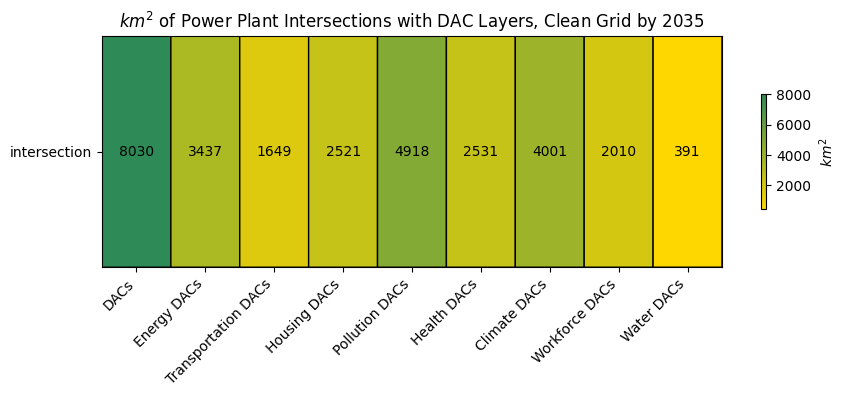

In [13]:
intersection_label = f'Intersections with {analysis_type}, {scenario}'

print(f'\n{intersection_label}:\n')
total_intersections = calculate_total_intersections_by_layer(analysis_df=analysis_df, layer_dict=layer_dict, level=None)

plot_heatmap(plot_df=total_intersections, title=f'$km^2$ of Power Plant {intersection_label}', 
             figsize=(10, 3), output_file_name='layer_heatmaps/heatmap_clean_grid_total_dac.png')

##### Calculate Total Intersections by Technology


Intersections by technology type with DAC Layers, Clean Grid by 2035:



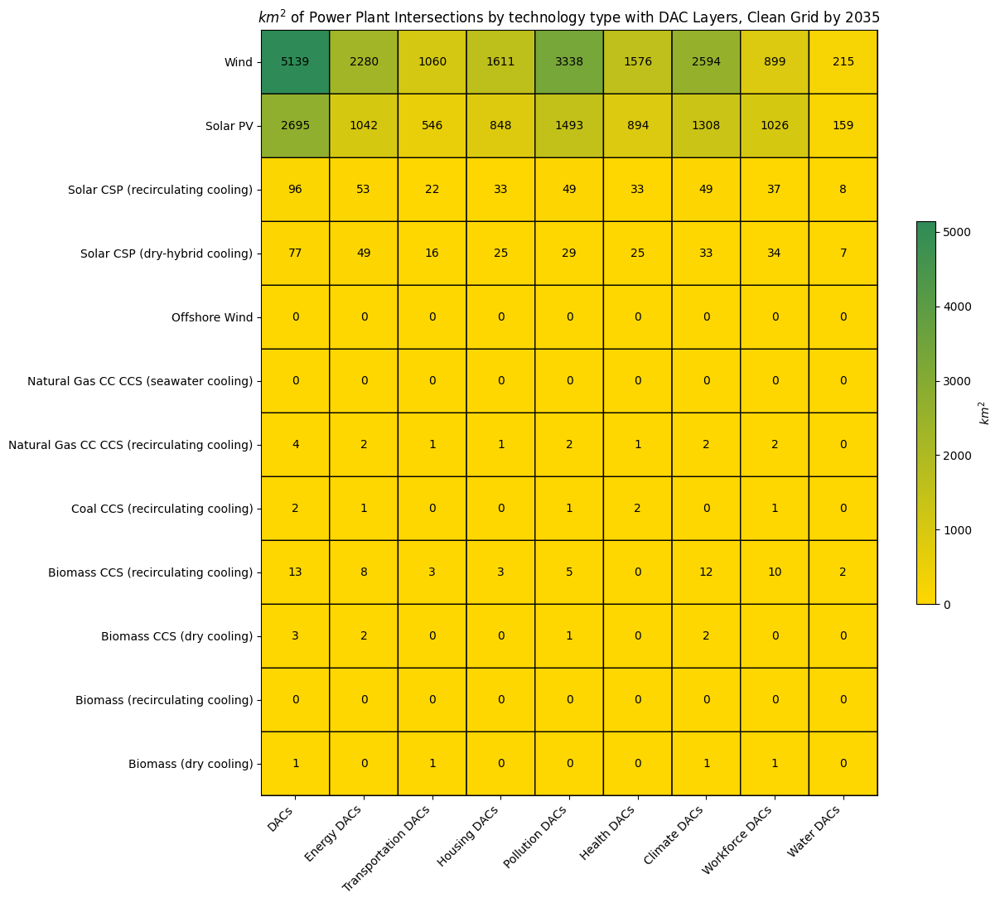

In [14]:
intersection_label = f'Intersections by technology type with {analysis_type}, {scenario}'

print(f'\n{intersection_label}:\n')
tech_intersections = calculate_total_intersections_by_layer(analysis_df=analysis_df, layer_dict=layer_dict, level='tech')

plot_heatmap(plot_df=tech_intersections, title=f'$km^2$ of Power Plant {intersection_label}',
             output_file_name='layer_heatmaps/heatmap_clean_grid_tech_dac.png')

##### Calculate Total Intersections by State


Intersections by state with DAC Layers, Clean Grid by 2035:



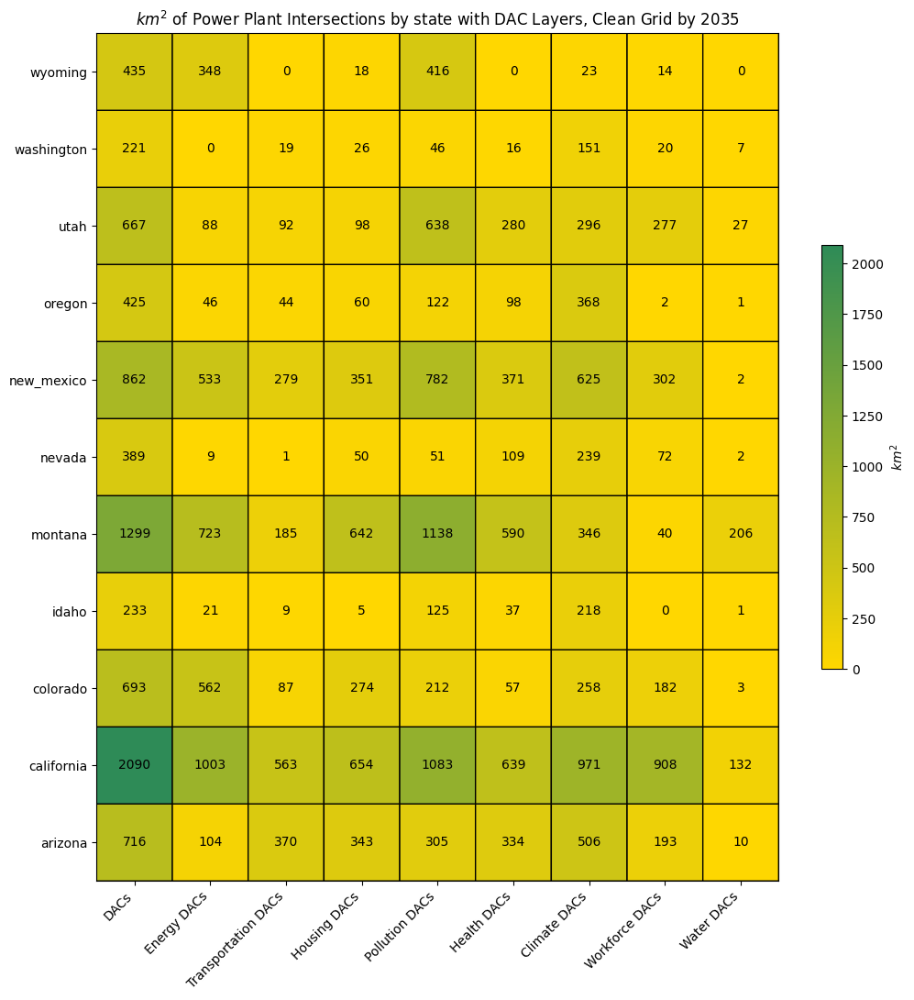

In [15]:
intersection_label = f'Intersections by state with {analysis_type}, {scenario}'

print(f'\n{intersection_label}:\n')
state_intersections = calculate_total_intersections_by_layer(analysis_df=analysis_df, layer_dict=layer_dict, level='state')

plot_heatmap(plot_df=state_intersections, title=f'$km^2$ of Power Plant {intersection_label}',
             output_file_name='layer_heatmaps/heatmap_clean_grid_state_dac.png')

##### Calculate Total Intersections by State & Technology


Intersections by state and technology with DAC Layers, Clean Grid by 2035:



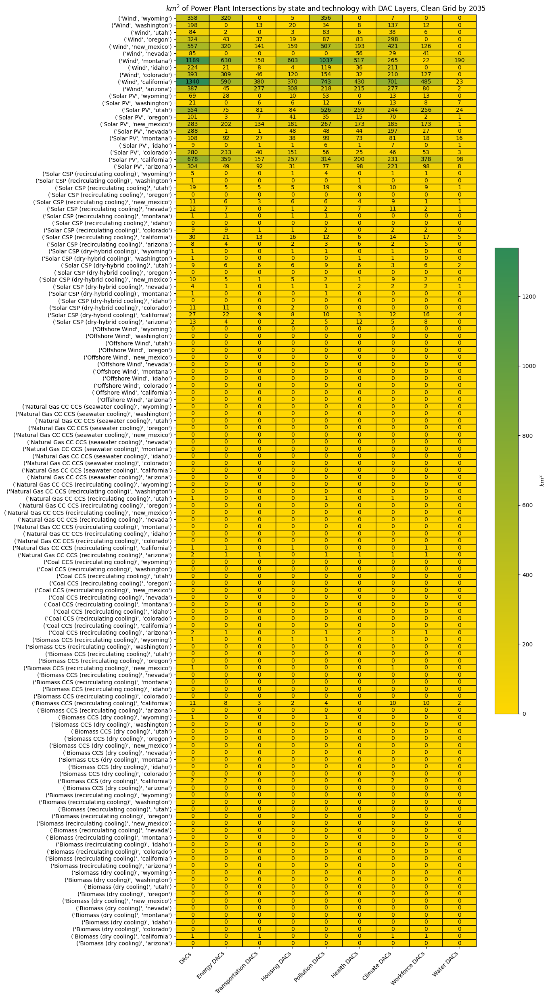

In [16]:
intersection_label = f'Intersections by state and technology with {analysis_type}, {scenario}'

print(f'\n{intersection_label}:\n')
state_tech_intersections = calculate_total_intersections_by_layer(analysis_df=analysis_df, layer_dict=layer_dict, level='state_tech')

plot_heatmap(plot_df=state_tech_intersections, title=f'$km^2$ of Power Plant {intersection_label}', figsize=(12, 30),
             output_file_name='layer_heatmaps/heatmap_clean_grid_tech_state_dac.png')

#### <b> Business-as-usual by 2035 - New Power Plant Sitings </b>

In [ ]:
analysis_df = bau_dac_df.copy()

##### Calculate Total Intersections by Layer


Intersections with DAC Layers, Business-as-usual by 2035:



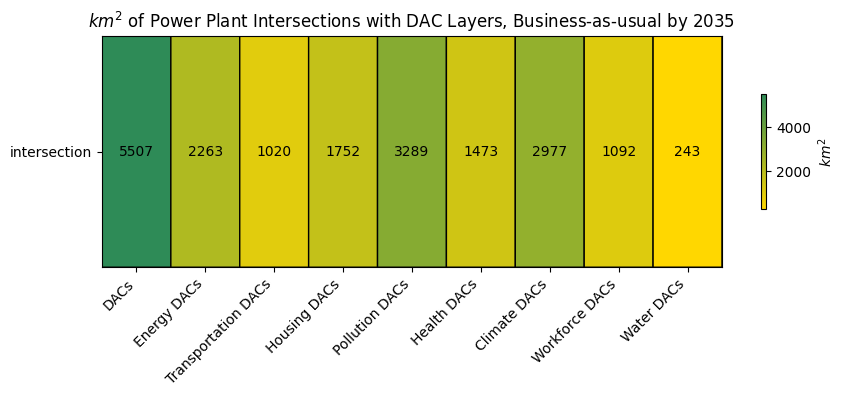

In [52]:
intersection_label = f'Intersections with {analysis_type}, {scenario}'

print(f'\n{intersection_label}:\n')
total_intersections = calculate_total_intersections_by_layer(analysis_df=analysis_df, layer_dict=layer_dict, level=None)

plot_heatmap(plot_df=total_intersections, title=f'$km^2$ of Power Plant {intersection_label}', 
             figsize=(10, 3), output_file_name='layer_heatmaps/heatmap_bau_total_dac.png')

##### Calculate Total Intersections by Technology


Intersections by technology type with DAC Layers, Business-as-usual by 2035:



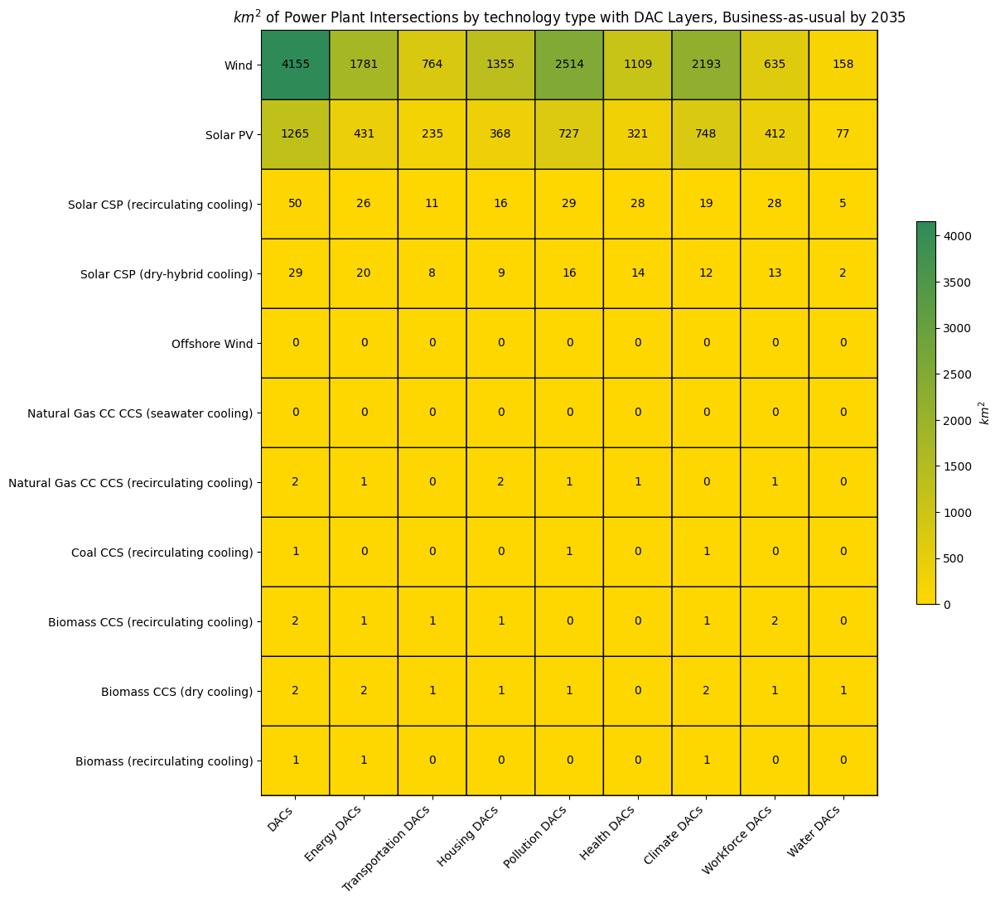

In [53]:
intersection_label = f'Intersections by technology type with {analysis_type}, {scenario}'

print(f'\n{intersection_label}:\n')
tech_intersections = calculate_total_intersections_by_layer(analysis_df=analysis_df, layer_dict=layer_dict, level='tech')

plot_heatmap(plot_df=tech_intersections, title=f'$km^2$ of Power Plant {intersection_label}',
             output_file_name='layer_heatmaps/heatmap_bau_tech_dac.png')

##### Calculate Total Intersections by State


Intersections by state with DAC Layers, Business-as-usual by 2035:



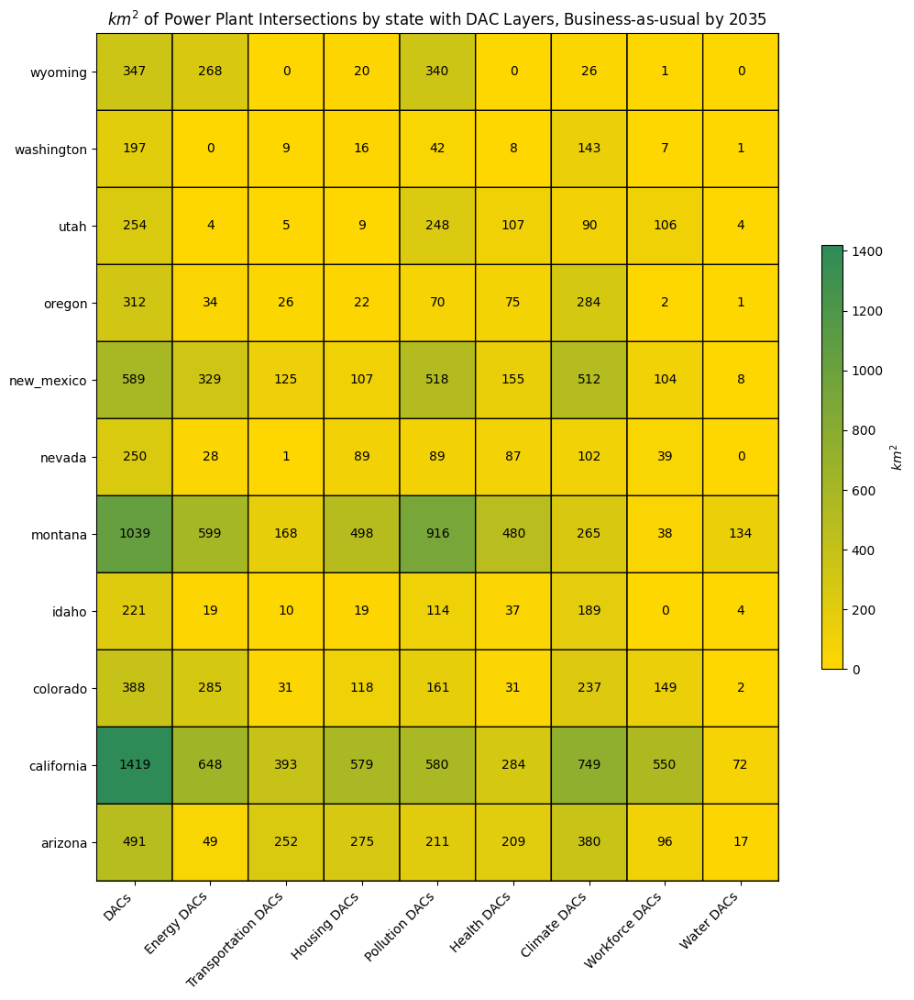

In [54]:
intersection_label = f'Intersections by state with {analysis_type}, {scenario}'

print(f'\n{intersection_label}:\n')
state_intersections = calculate_total_intersections_by_layer(analysis_df=analysis_df, layer_dict=layer_dict, level='state')

plot_heatmap(plot_df=state_intersections, title=f'$km^2$ of Power Plant {intersection_label}',
             output_file_name='layer_heatmaps/heatmap_bau_state_dac.png')

##### Calculate Total Intersections by State & Technology


Intersections by state and technology with DAC Layers, Business-as-usual by 2035:



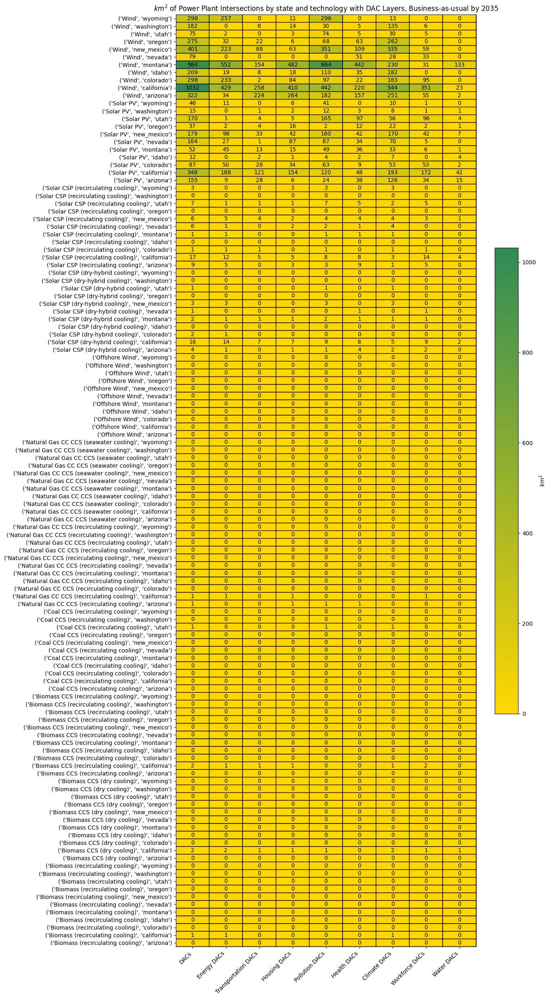

In [55]:
intersection_label = f'Intersections by state and technology with {analysis_type}, {scenario}'

print(f'\n{intersection_label}:\n')
state_tech_intersections = calculate_total_intersections_by_layer(analysis_df=analysis_df, layer_dict=layer_dict, level='state_tech')

plot_heatmap(plot_df=state_tech_intersections, title=f'$km^2$ of Power Plant {intersection_label}', figsize=(12, 30),
             output_file_name='layer_heatmaps/heatmap_bau_tech_state_dac.png')

## Important Farmland

<b> Scientific Question Addressed </b>: Under decarbonization and business-as-usual scenarios, how much land required for new power plant infrastructure intersects with important farmland?

#### **Clean Grid by 2035 - New Power Plant Sitings**

In [ ]:
analysis_df = cg_farm_df.copy()

##### Calculate Total Intersections by Layer


Intersections with Important Farmland Layers, Clean Grid by 2035:



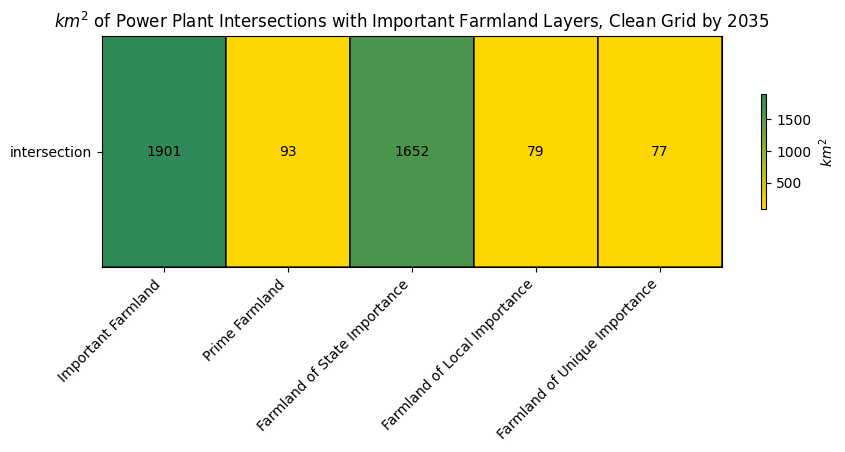

In [21]:
intersection_label = f'Intersections with {analysis_type}, {scenario}'

print(f'\n{intersection_label}:\n')
total_intersections = calculate_total_intersections_by_layer(analysis_df=analysis_df, layer_dict=layer_dict, level=None)

plot_heatmap(plot_df=total_intersections, title=f'$km^2$ of Power Plant {intersection_label}', 
             figsize=(10, 3), output_file_name='layer_heatmaps/heatmap_clean_grid_total_important_farmland.png')

##### Calculate Total Intersections by Technology


Intersections by technology type with Important Farmland Layers, Clean Grid by 2035:



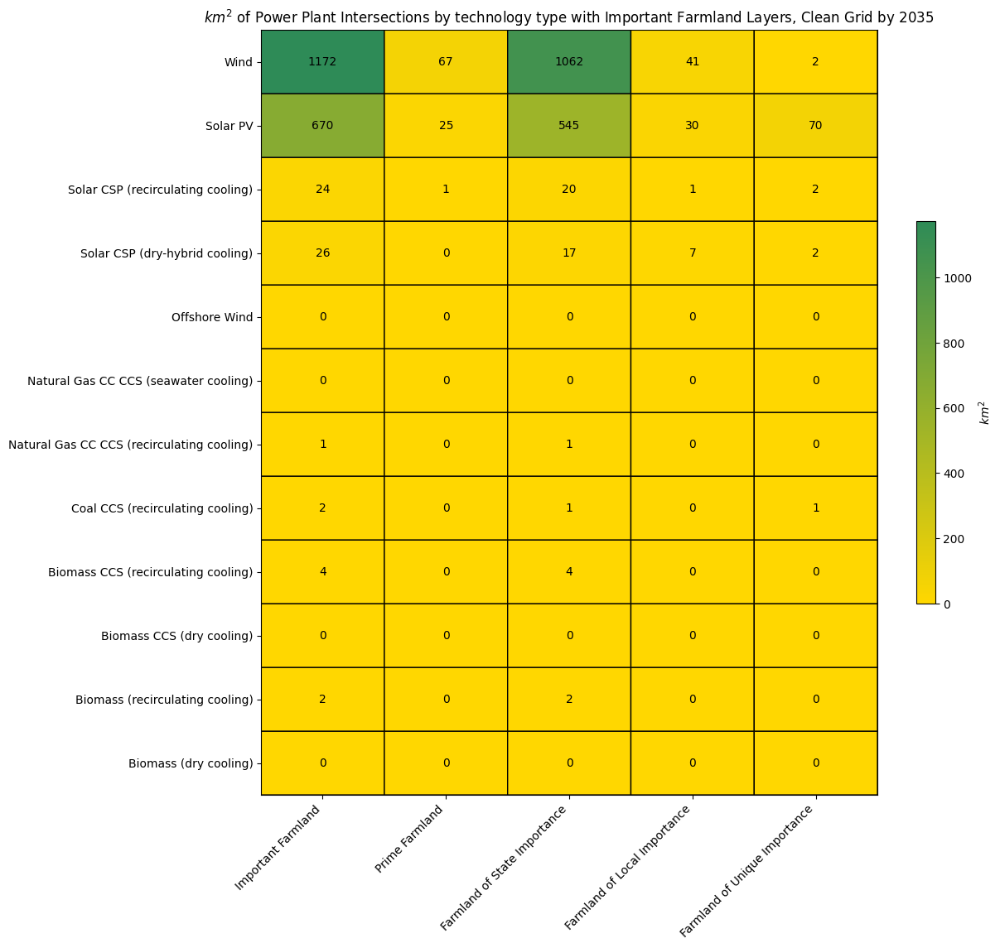

In [22]:
intersection_label = f'Intersections by technology type with {analysis_type}, {scenario}'

print(f'\n{intersection_label}:\n')
tech_intersections = calculate_total_intersections_by_layer(analysis_df=analysis_df, layer_dict=layer_dict, level='tech')

plot_heatmap(plot_df=tech_intersections, title=f'$km^2$ of Power Plant {intersection_label}',
             output_file_name='layer_heatmaps/heatmap_clean_grid_tech_important_farmland.png')

##### Calculate Total Intersections by State


Intersections by state with Important Farmland Layers, Clean Grid by 2035:



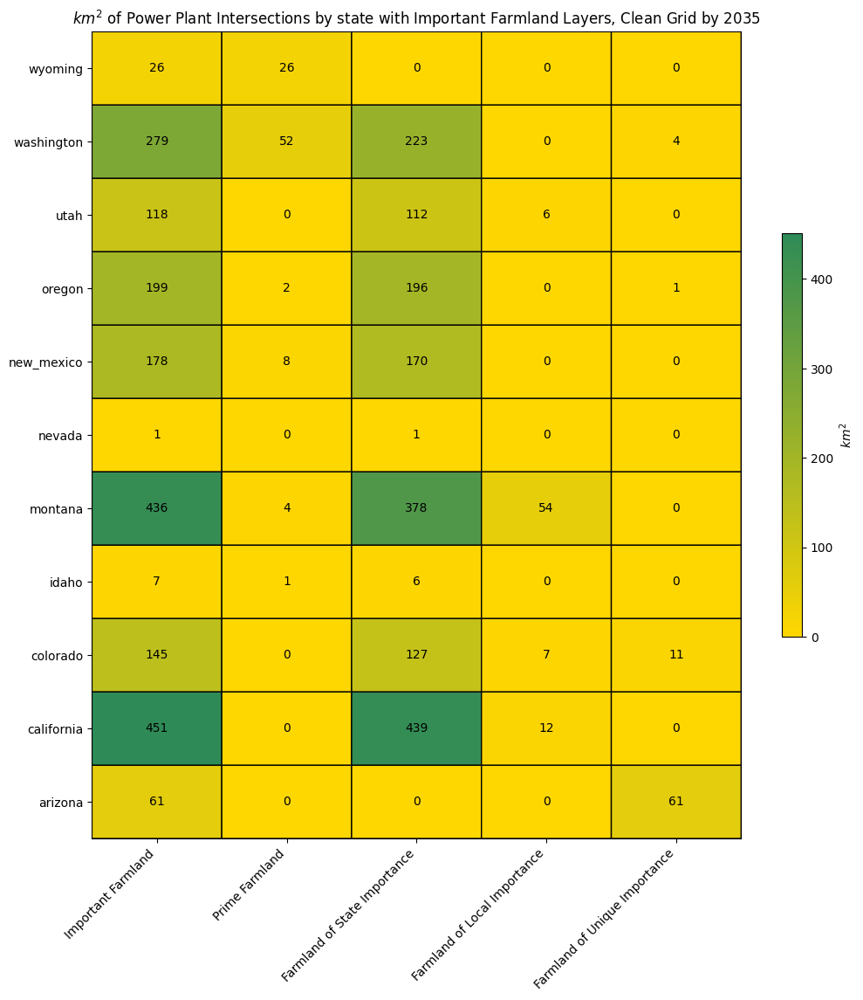

In [23]:
intersection_label = f'Intersections by state with {analysis_type}, {scenario}'

print(f'\n{intersection_label}:\n')
state_intersections = calculate_total_intersections_by_layer(analysis_df=analysis_df, layer_dict=layer_dict, level='state')

plot_heatmap(plot_df=state_intersections, title=f'$km^2$ of Power Plant {intersection_label}',
             output_file_name='layer_heatmaps/heatmap_clean_grid_state_important_farmland.png')

##### Calculate Total Intersections by State & Technology


Intersections by state and technology with Important Farmland Layers, Clean Grid by 2035:



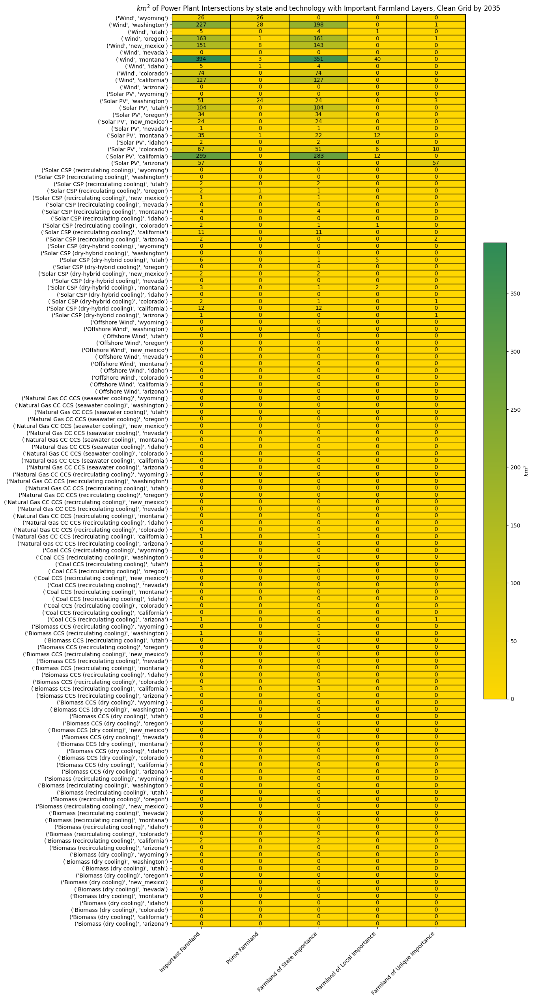

In [24]:
intersection_label = f'Intersections by state and technology with {analysis_type}, {scenario}'

print(f'\n{intersection_label}:\n')
state_tech_intersections = calculate_total_intersections_by_layer(analysis_df=analysis_df, layer_dict=layer_dict, level='state_tech')

plot_heatmap(plot_df=state_tech_intersections, title=f'$km^2$ of Power Plant {intersection_label}', figsize=(12, 30),
             output_file_name='layer_heatmaps/heatmap_clean_grid_tech_state_important_farmland.png')

#### **Business-as-usual by 2035 - New Power Plant Sitings**

In [ ]:
analysis_df = bau_farm_df.copy()

##### Calculate Total Intersections by Layer


Intersections with Important Farmland Layers, Business-as-usual by 2035:



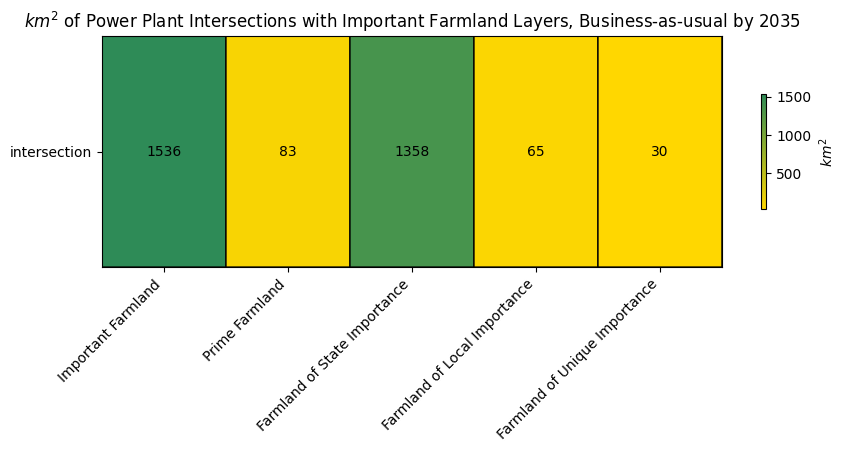

In [59]:
intersection_label = f'Intersections with {analysis_type}, {scenario}'

print(f'\n{intersection_label}:\n')
total_intersections = calculate_total_intersections_by_layer(analysis_df=analysis_df, layer_dict=layer_dict, level=None)

plot_heatmap(plot_df=total_intersections, title=f'$km^2$ of Power Plant {intersection_label}', 
             figsize=(10, 3), output_file_name='layer_heatmaps/heatmap_bau_total_important_farmland.png')

##### Calculate Total Intersections by Technology


Intersections by technology type with Important Farmland Layers, Business-as-usual by 2035:



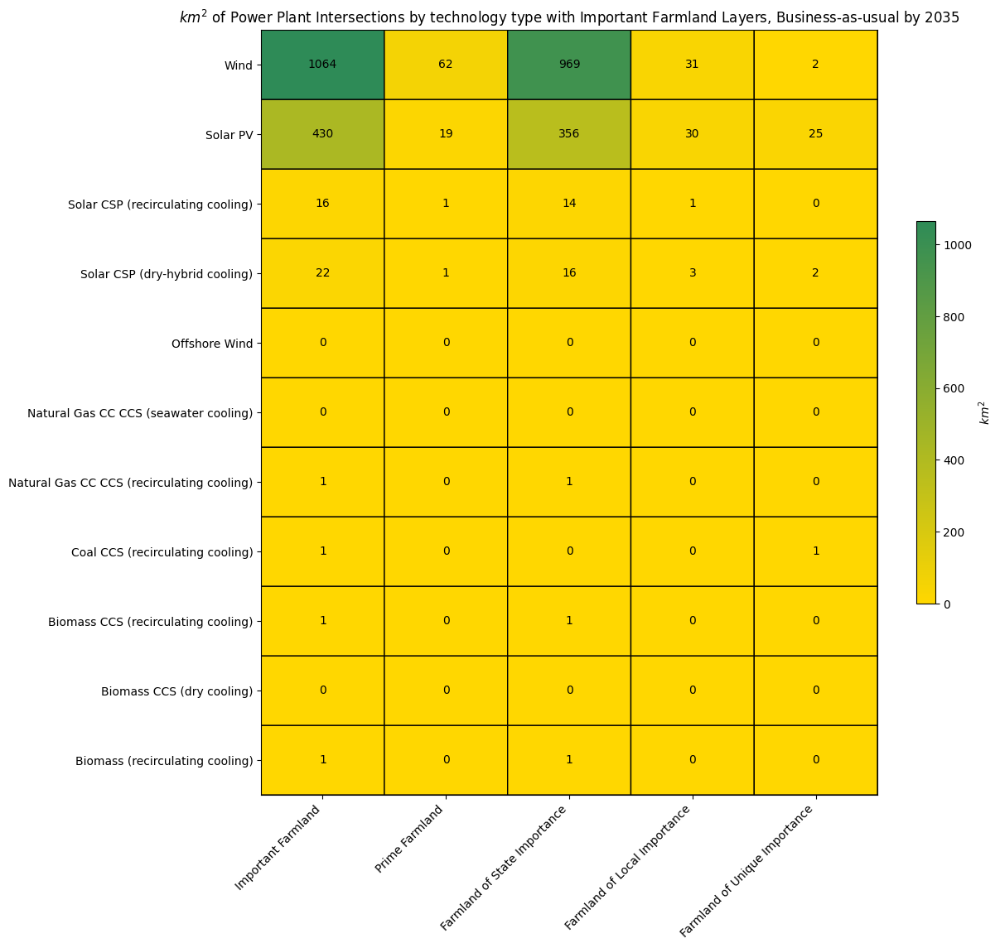

In [60]:
intersection_label = f'Intersections by technology type with {analysis_type}, {scenario}'

print(f'\n{intersection_label}:\n')
tech_intersections = calculate_total_intersections_by_layer(analysis_df=analysis_df, layer_dict=layer_dict, level='tech')

plot_heatmap(plot_df=tech_intersections, title=f'$km^2$ of Power Plant {intersection_label}',
             output_file_name='layer_heatmaps/heatmap_bau_tech_important_farmland.png')

##### Calculate Total Intersections by State


Intersections by state with Important Farmland Layers, Business-as-usual by 2035:



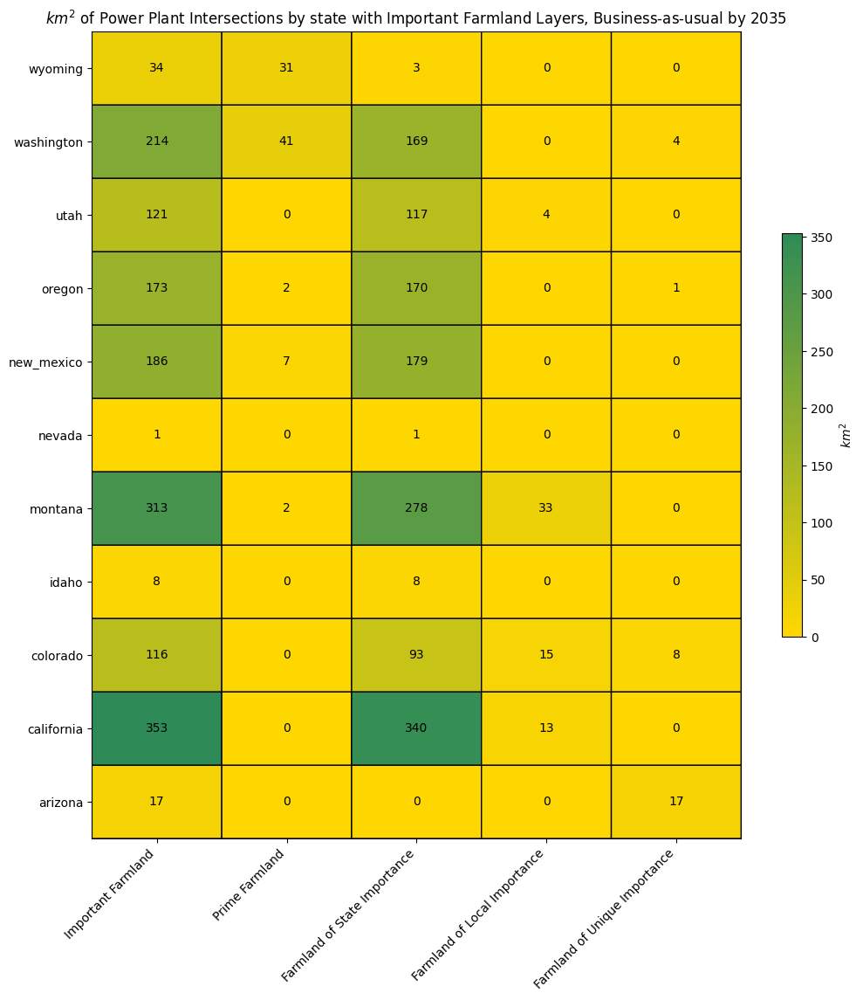

In [61]:
intersection_label = f'Intersections by state with {analysis_type}, {scenario}'

print(f'\n{intersection_label}:\n')
state_intersections = calculate_total_intersections_by_layer(analysis_df=analysis_df, layer_dict=layer_dict, level='state')

plot_heatmap(plot_df=state_intersections, title=f'$km^2$ of Power Plant {intersection_label}',
             output_file_name='layer_heatmaps/heatmap_bau_state_important_farmland.png')

##### Calculate Total Intersections by State & Technology


Intersections by state and technology with Important Farmland Layers, Business-as-usual by 2035:



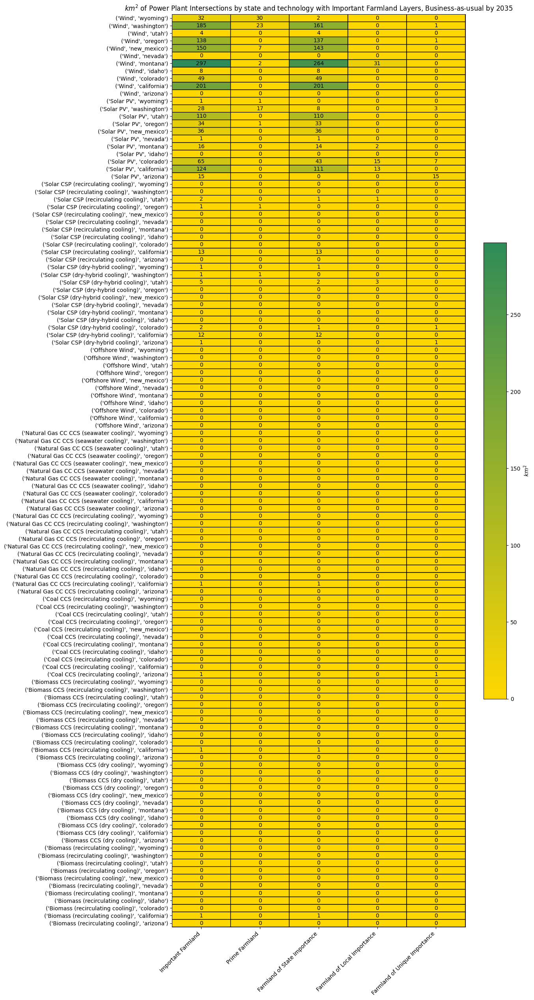

In [62]:
intersection_label = f'Intersections by state and technology with {analysis_type}, {scenario}'

print(f'\n{intersection_label}:\n')
state_tech_intersections = calculate_total_intersections_by_layer(analysis_df=analysis_df, layer_dict=layer_dict, level='state_tech')

plot_heatmap(plot_df=state_tech_intersections, title=f'$km^2$ of Power Plant {intersection_label}', figsize=(12, 30),
             output_file_name='layer_heatmaps/heatmap_bau_tech_state_important_farmland.png')

## Natural Area Proximity

<b> Scientific Question Addressed </b>: Under decarbonization and business-as-usual scenarios, how much land required for new power plant infrastructure intersects with areas in close proximity to natural areas?

In [ ]:
analysis_df = cg_env_df.copy()

##### Calculate Total Intersections by Layer


Intersections with Natural Area Proximity, Clean Grid by 2035:



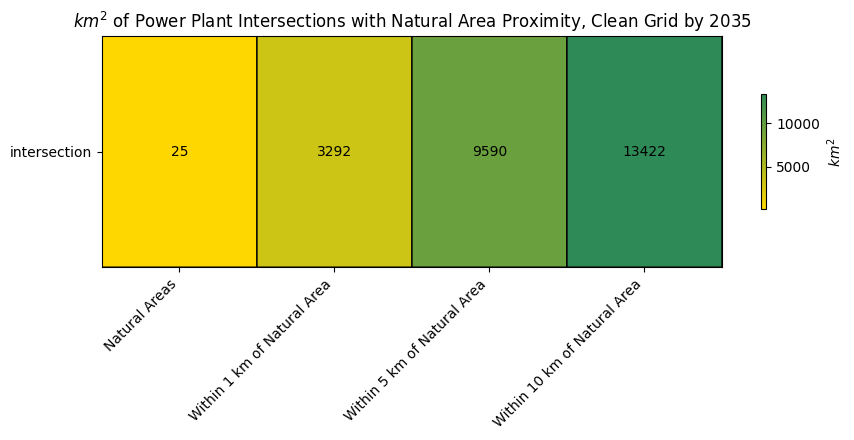

In [42]:
intersection_label = f'Intersections with {analysis_type}, {scenario}'

print(f'\n{intersection_label}:\n')
total_intersections = calculate_total_intersections_by_layer(analysis_df=analysis_df, layer_dict=layer_dict, level=None)

plot_heatmap(plot_df=total_intersections, title=f'$km^2$ of Power Plant {intersection_label}', 
             figsize=(10, 3), output_file_name='layer_heatmaps/heatmap_clean_grid_total_env_proximity.png')

##### Calculate Total Intersections by Technology


Intersections by technology type with Natural Area Proximity, Clean Grid by 2035:



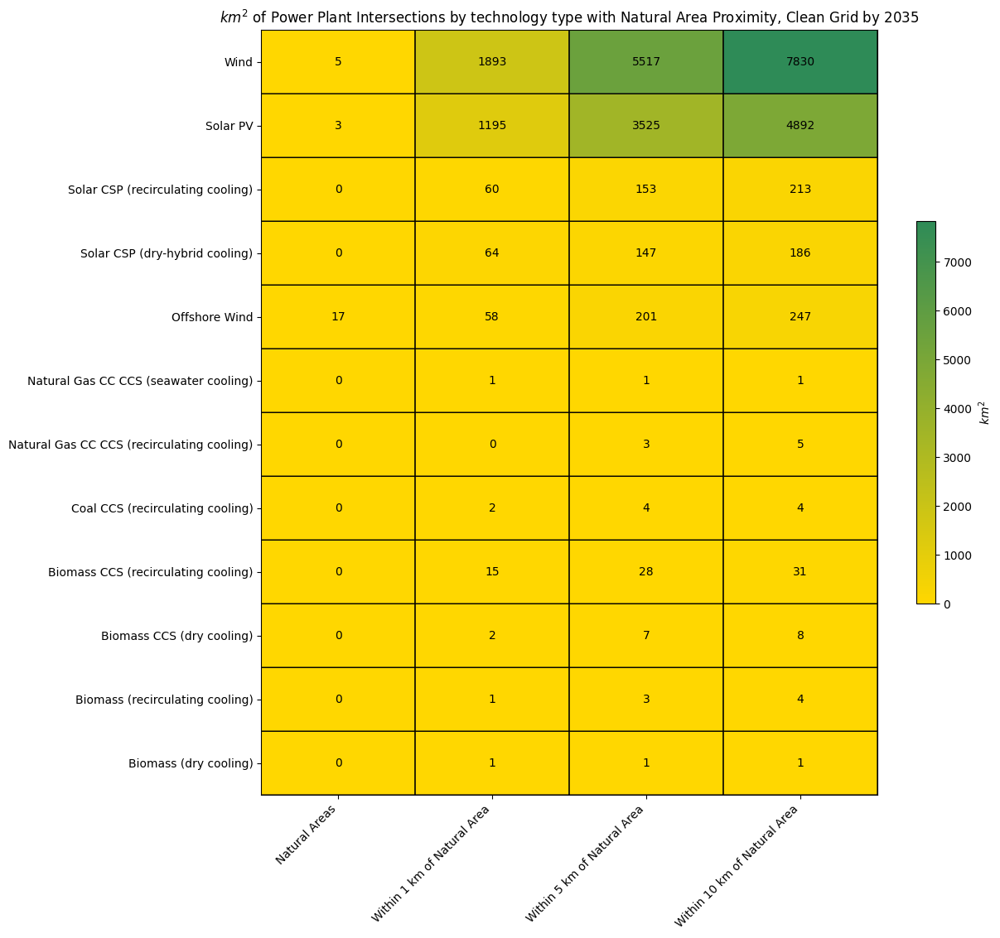

In [43]:
intersection_label = f'Intersections by technology type with {analysis_type}, {scenario}'

print(f'\n{intersection_label}:\n')
tech_intersections = calculate_total_intersections_by_layer(analysis_df=analysis_df, layer_dict=layer_dict, level='tech')

plot_heatmap(plot_df=tech_intersections, title=f'$km^2$ of Power Plant {intersection_label}',
             output_file_name='layer_heatmaps/heatmap_clean_grid_tech_env_proximity.png')

##### Calculate Total Intersections by State


Intersections by state with Natural Area Proximity, Clean Grid by 2035:



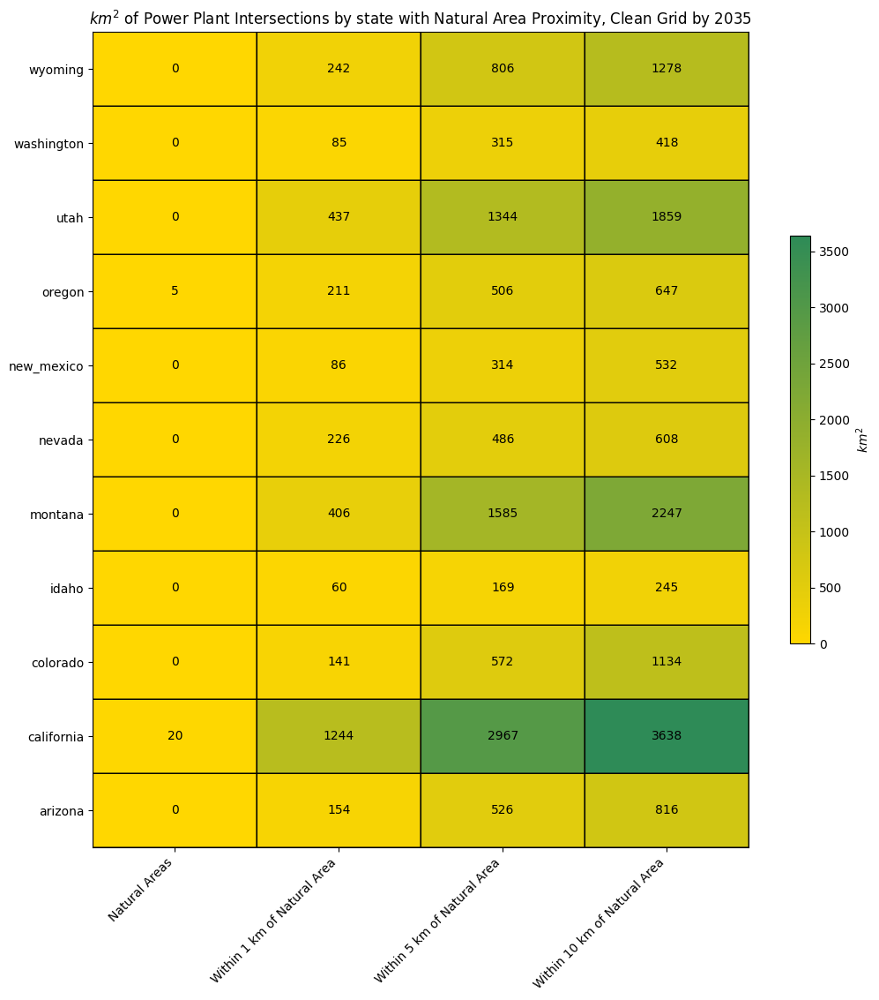

In [44]:
intersection_label = f'Intersections by state with {analysis_type}, {scenario}'

print(f'\n{intersection_label}:\n')
state_intersections = calculate_total_intersections_by_layer(analysis_df=analysis_df, layer_dict=layer_dict, level='state')

plot_heatmap(plot_df=state_intersections, title=f'$km^2$ of Power Plant {intersection_label}',
             output_file_name='layer_heatmaps/heatmap_clean_grid_state_env_proximity.png')

##### Calculate Total Intersections by State & Technology


Intersections by state and technology with Natural Area Proximity, Clean Grid by 2035:



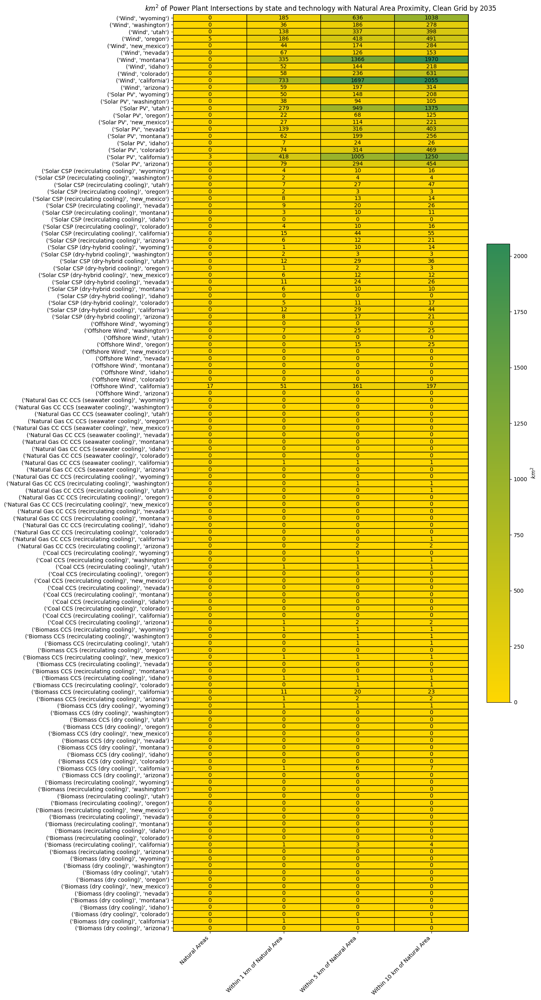

In [45]:
intersection_label = f'Intersections by state and technology with {analysis_type}, {scenario}'

print(f'\n{intersection_label}:\n')
state_tech_intersections = calculate_total_intersections_by_layer(analysis_df=analysis_df, layer_dict=layer_dict, level='state_tech')

plot_heatmap(plot_df=state_tech_intersections, title=f'$km^2$ of Power Plant {intersection_label}', figsize=(12, 30),
             output_file_name='layer_heatmaps/heatmap_clean_grid_tech_state_env_proximity.png')

#### **Business-as-usual by 2035 - New Power Plant Sitings**

In [ ]:
analysis_df = bau_env_df.copy()

##### Calculate Total Intersections by Layer


Intersections with Natural Area Proximity, Business-as-usual by 2035:



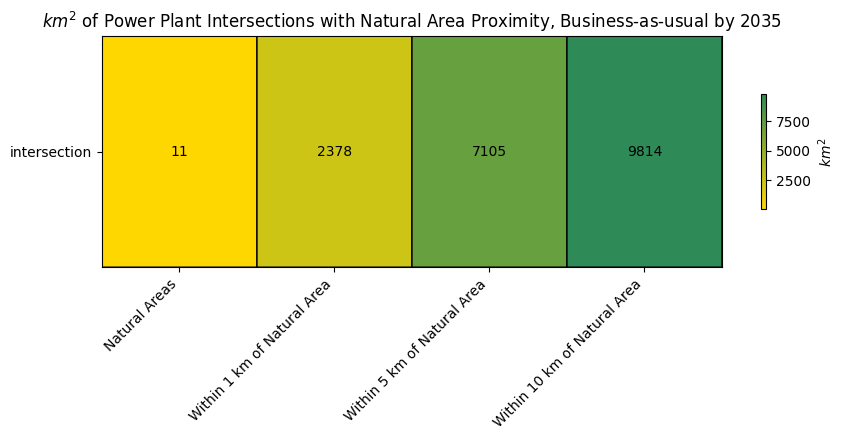

In [66]:
intersection_label = f'Intersections with {analysis_type}, {scenario}'

print(f'\n{intersection_label}:\n')
total_intersections = calculate_total_intersections_by_layer(analysis_df=analysis_df, layer_dict=layer_dict, level=None)

plot_heatmap(plot_df=total_intersections, title=f'$km^2$ of Power Plant {intersection_label}', 
             figsize=(10, 3), output_file_name='layer_heatmaps/heatmap_bau_total_env_proximity.png')

##### Calculate Total Intersections by Technology


Intersections by technology type with Natural Area Proximity, Business-as-usual by 2035:



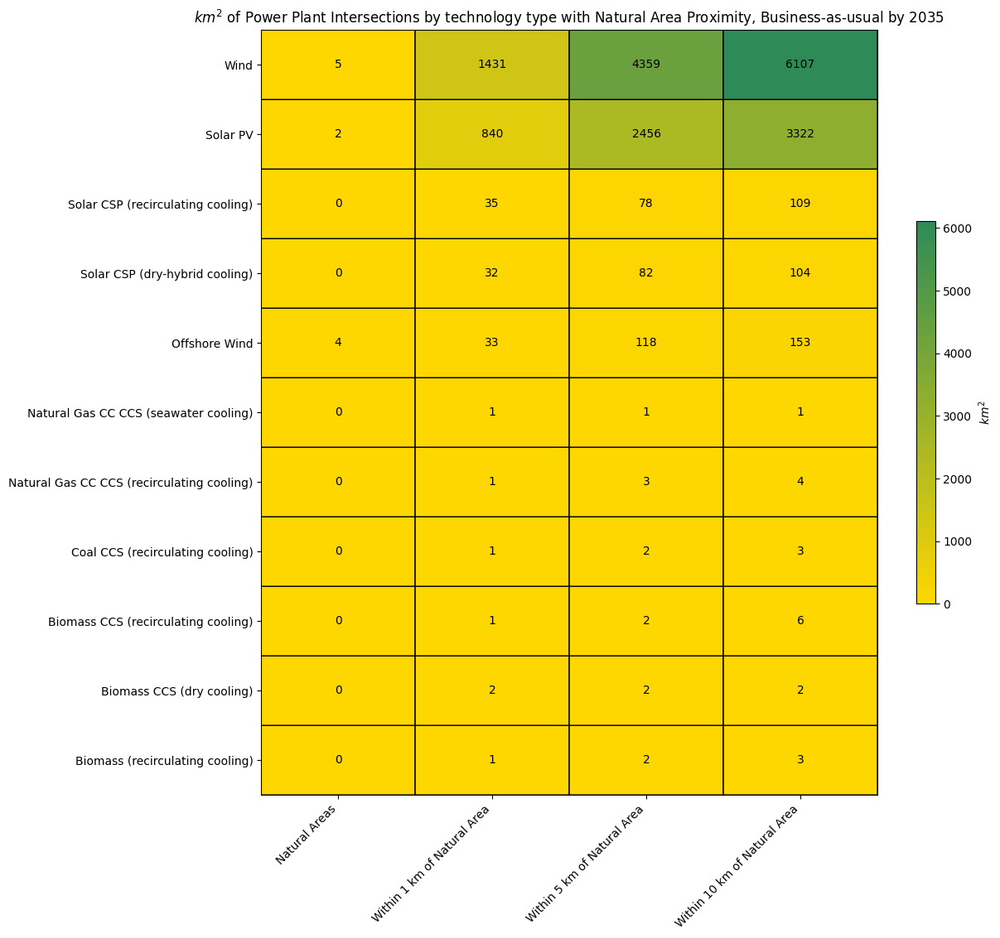

In [67]:
intersection_label = f'Intersections by technology type with {analysis_type}, {scenario}'

print(f'\n{intersection_label}:\n')
tech_intersections = calculate_total_intersections_by_layer(analysis_df=analysis_df, layer_dict=layer_dict, level='tech')

plot_heatmap(plot_df=tech_intersections, title=f'$km^2$ of Power Plant {intersection_label}',
             output_file_name='layer_heatmaps/heatmap_bau_tech_env_proximity.png')

##### Calculate Total Intersections by State


Intersections by state with Natural Area Proximity, Business-as-usual by 2035:



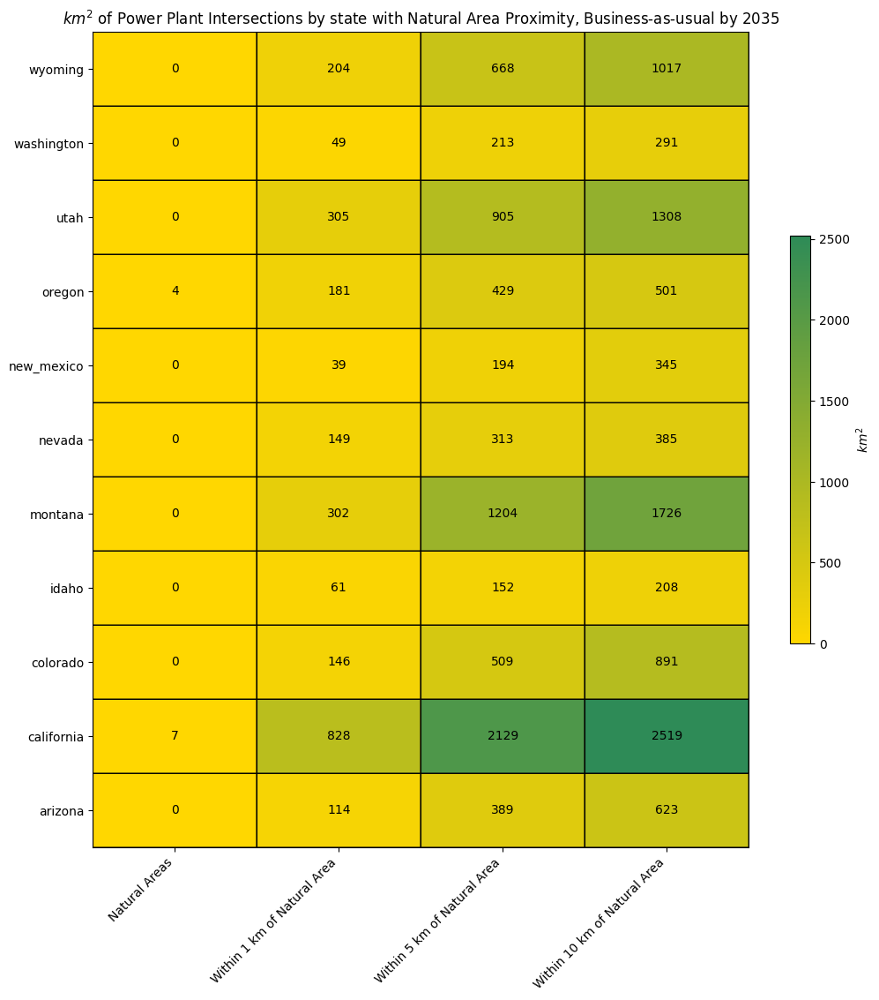

In [68]:
intersection_label = f'Intersections by state with {analysis_type}, {scenario}'

print(f'\n{intersection_label}:\n')
state_intersections = calculate_total_intersections_by_layer(analysis_df=analysis_df, layer_dict=layer_dict, level='state')

plot_heatmap(plot_df=state_intersections, title=f'$km^2$ of Power Plant {intersection_label}',
             output_file_name='layer_heatmaps/heatmap_bau_state_env_proximity.png')

##### Calculate Total Intersections by State & Technology


Intersections by state and technology with Natural Area Proximity, Business-as-usual by 2035:



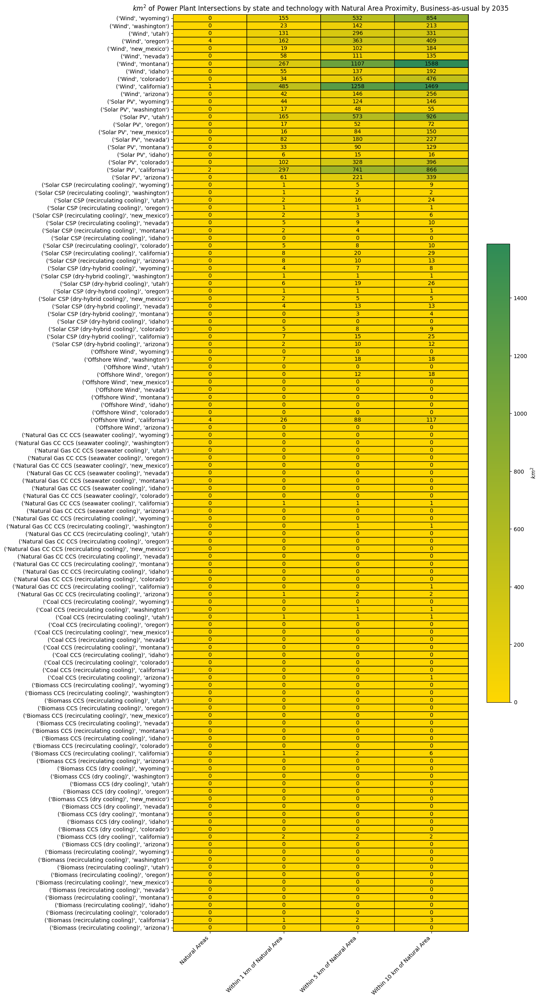

In [69]:
intersection_label = f'Intersections by state and technology with {analysis_type}, {scenario}'

print(f'\n{intersection_label}:\n')
state_tech_intersections = calculate_total_intersections_by_layer(analysis_df=analysis_df, layer_dict=layer_dict, level='state_tech')

plot_heatmap(plot_df=state_tech_intersections, title=f'$km^2$ of Power Plant {intersection_label}', figsize=(12, 30),
             output_file_name='layer_heatmaps/heatmap_bau_tech_state_env_proximity.png')

_____________

# Difference Analysis
This section calculates the additional land intersections between the Clean Grid and Business-as-usual scenario.

<b>Scientific Question:</b> How much <i>additional</i> land in areas of interest will achieving a decarbonized grid take? 

## Disadvantaged Communities

In [ ]:
analysis_df = diff_dac_df.copy()

##### Calculate Total Intersections by Layer

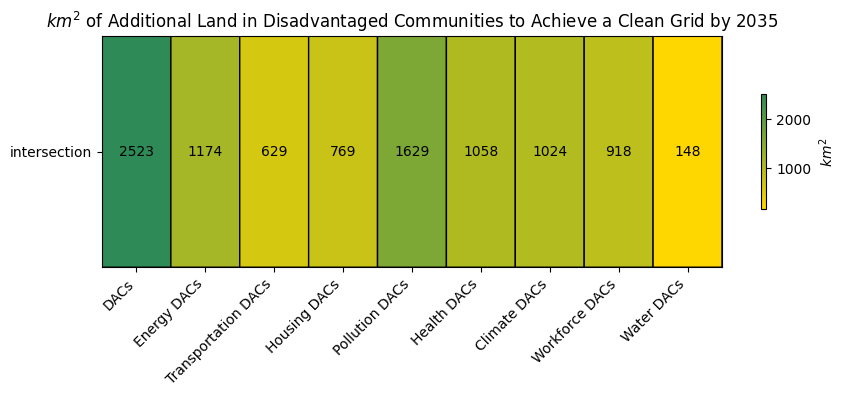

In [134]:
total_intersections = calculate_total_intersections_by_layer(analysis_df=analysis_df, layer_dict=layer_dict, level=None)

plot_heatmap(plot_df=total_intersections, title=f'$km^2$ of Additional Land in {analysis_type} to Achieve a Clean Grid by 2035', 
             figsize=(10, 3), output_file_name='layer_heatmaps/heatmap_diff_total_farmland.png')

##### Calculate Total Intersections by Technology

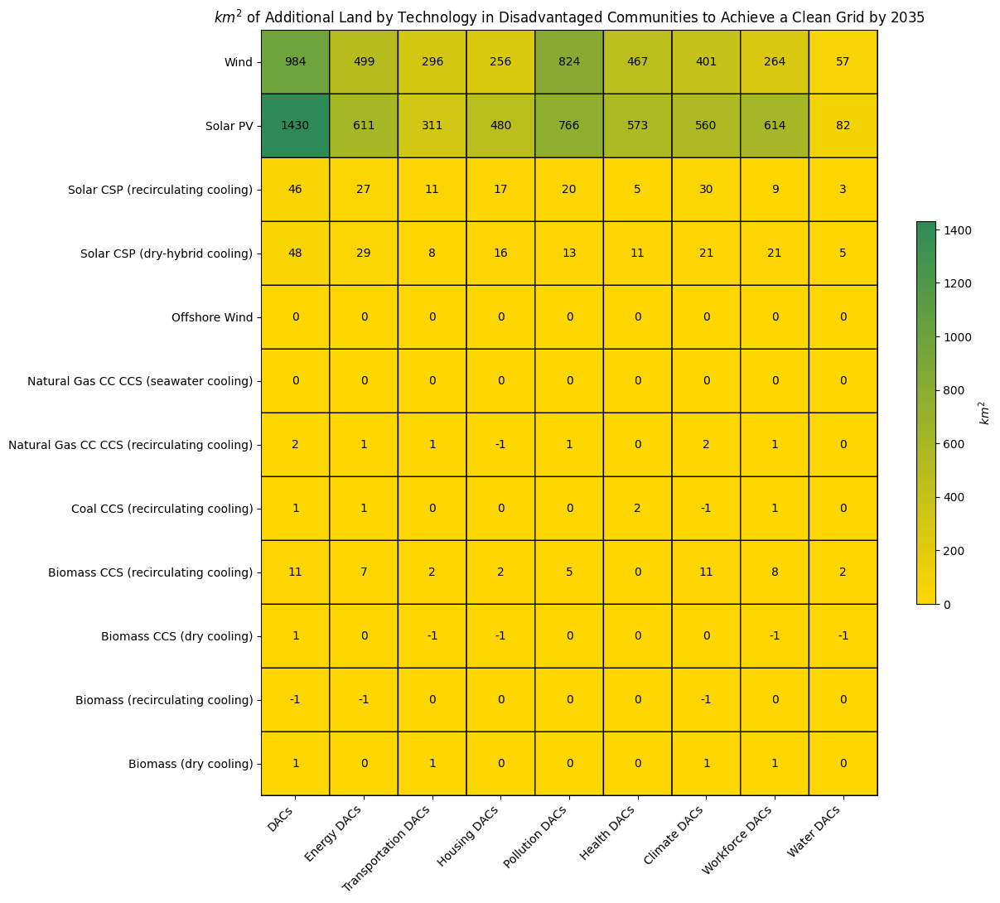

In [135]:
tech_intersections = calculate_total_intersections_by_layer(analysis_df=analysis_df, layer_dict=layer_dict, level='tech')

plot_heatmap(plot_df=tech_intersections, title=f'$km^2$ of Additional Land by Technology in {analysis_type} to Achieve a Clean Grid by 2035',
             output_file_name='layer_heatmaps/heatmap_diff_tech_dac.png')

##### Calculate Total Intersections by State

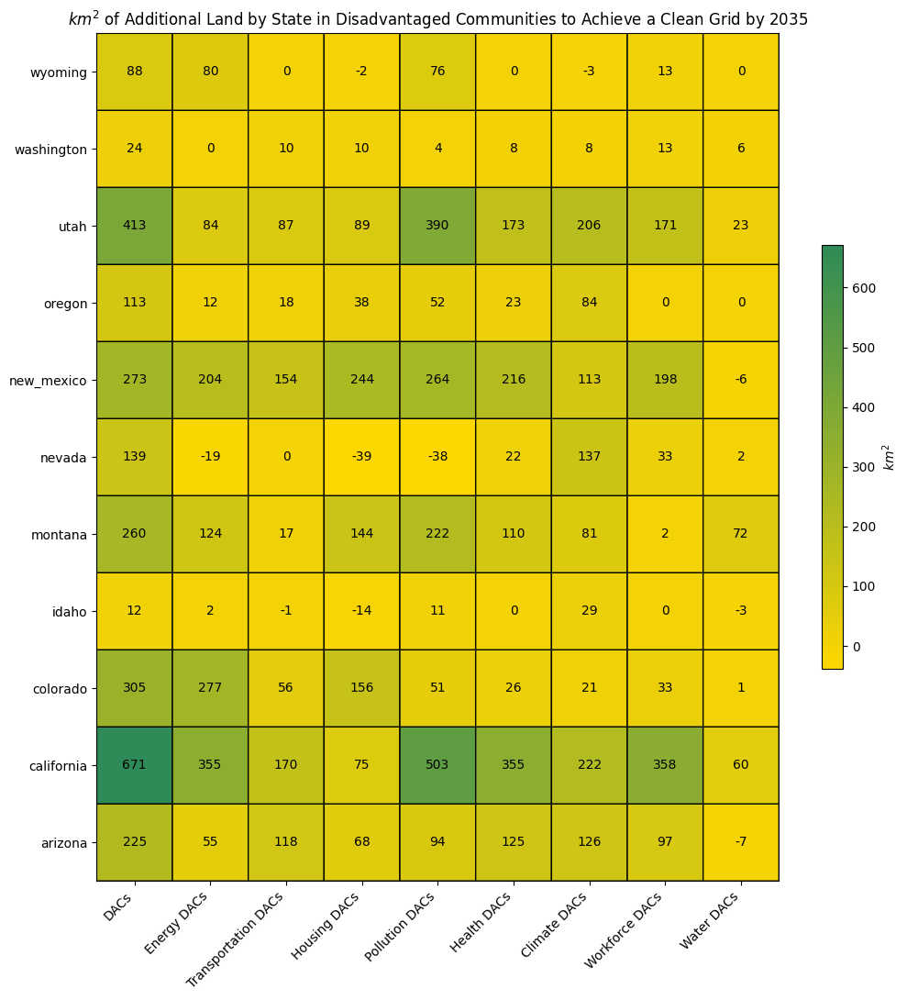

In [136]:
state_intersections = calculate_total_intersections_by_layer(analysis_df=analysis_df, layer_dict=layer_dict, level='state')

plot_heatmap(plot_df=state_intersections, 
             title=f'$km^2$ of Additional Land by State in {analysis_type} to Achieve a Clean Grid by 2035',
             output_file_name='layer_heatmaps/heatmap_diff_state_dac.png')

##### Calculate Total Intersections by State & Technology

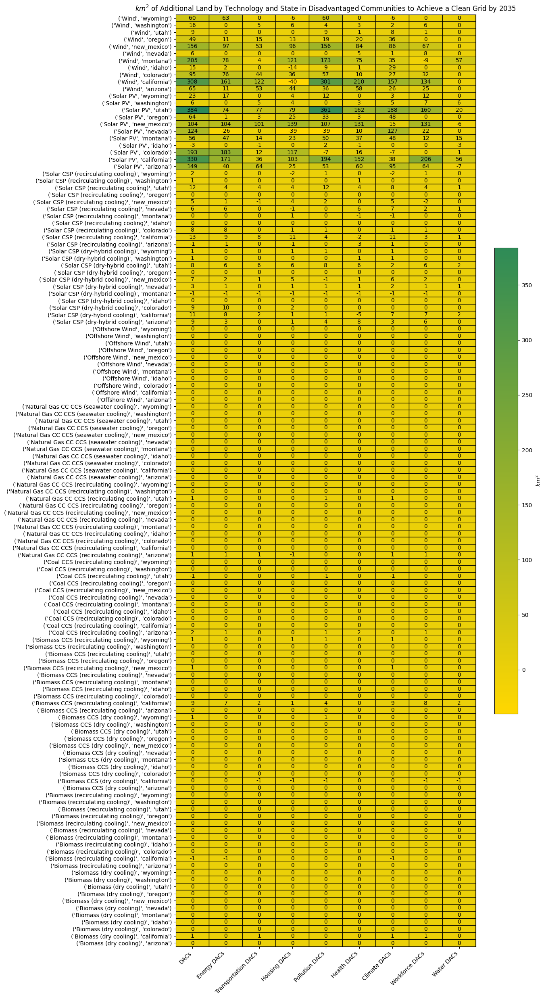

In [137]:
state_tech_intersections = calculate_total_intersections_by_layer(analysis_df=analysis_df, layer_dict=layer_dict, level='state_tech')

plot_heatmap(plot_df=state_tech_intersections, 
             title=f'$km^2$ of Additional Land by Technology and State in {analysis_type} to Achieve a Clean Grid by 2035', figsize=(12, 30),
             output_file_name='layer_heatmaps/heatmap_diff_tech_state_dac.png')


## Important Farmland


In [4]:
analysis_df = diff_farm_df.copy()

NameError: name 'diff_farm_df' is not defined

##### Calculate Total Intersections by Layer


Difference in intersections with Important Farmland:



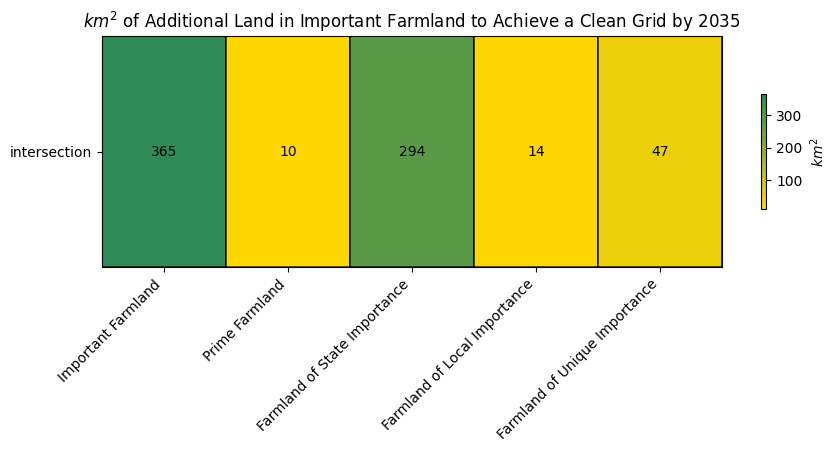

In [126]:
total_intersections = calculate_total_intersections_by_layer(analysis_df=analysis_df, layer_dict=layer_dict, level=None)

plot_heatmap(plot_df=total_intersections, title=f'$km^2$ of Additional Land in {analysis_type} to Achieve a Clean Grid by 2035', 
             figsize=(10, 3), output_file_name='layer_heatmaps/heatmap_diff_total_farmland.png')

##### Calculate Total Intersections by Technology


Intersections by technology type with Important Farmland, Business-as-usual by 2035:



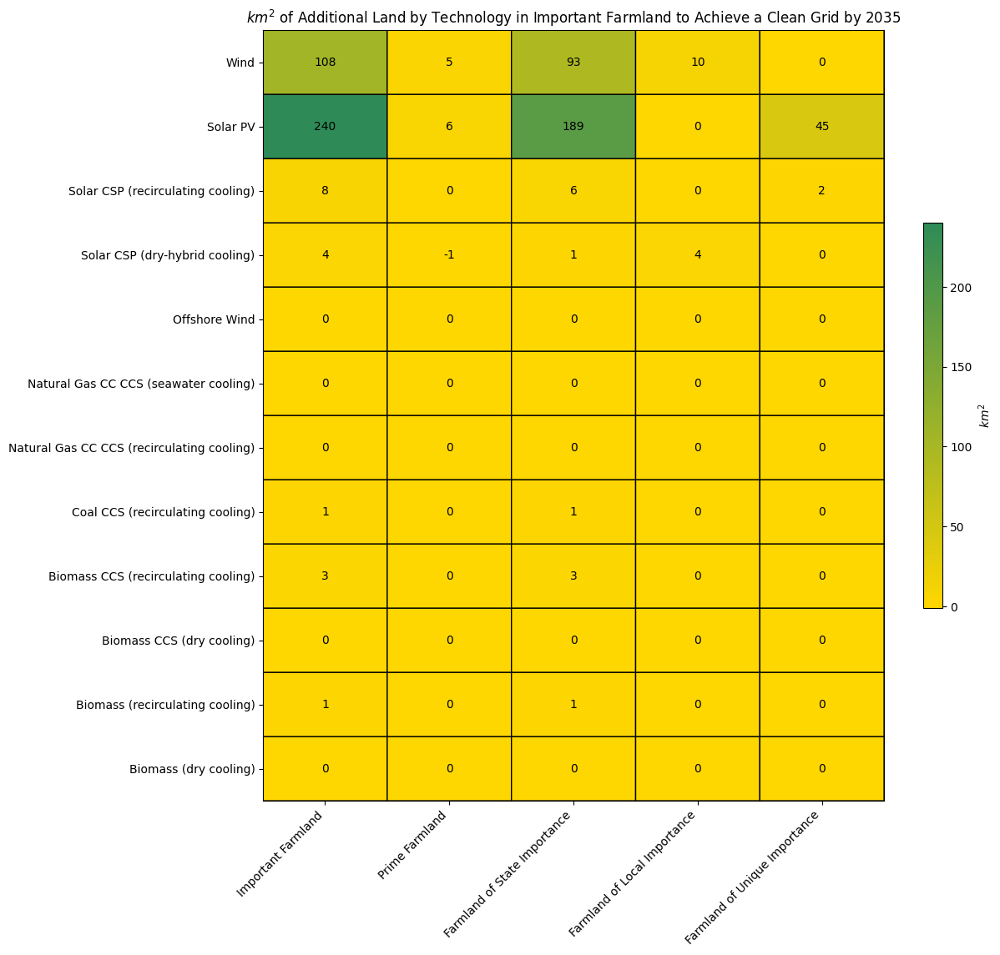

In [127]:
tech_intersections = calculate_total_intersections_by_layer(analysis_df=analysis_df, layer_dict=layer_dict, level='tech')

plot_heatmap(plot_df=tech_intersections, title=f'$km^2$ of Additional Land by Technology in {analysis_type} to Achieve a Clean Grid by 2035',
             output_file_name='layer_heatmaps/heatmap_diff_tech_farmland.png')

##### Calculate Total Intersections by State


Intersections by state with Important Farmland, Business-as-usual by 2035:



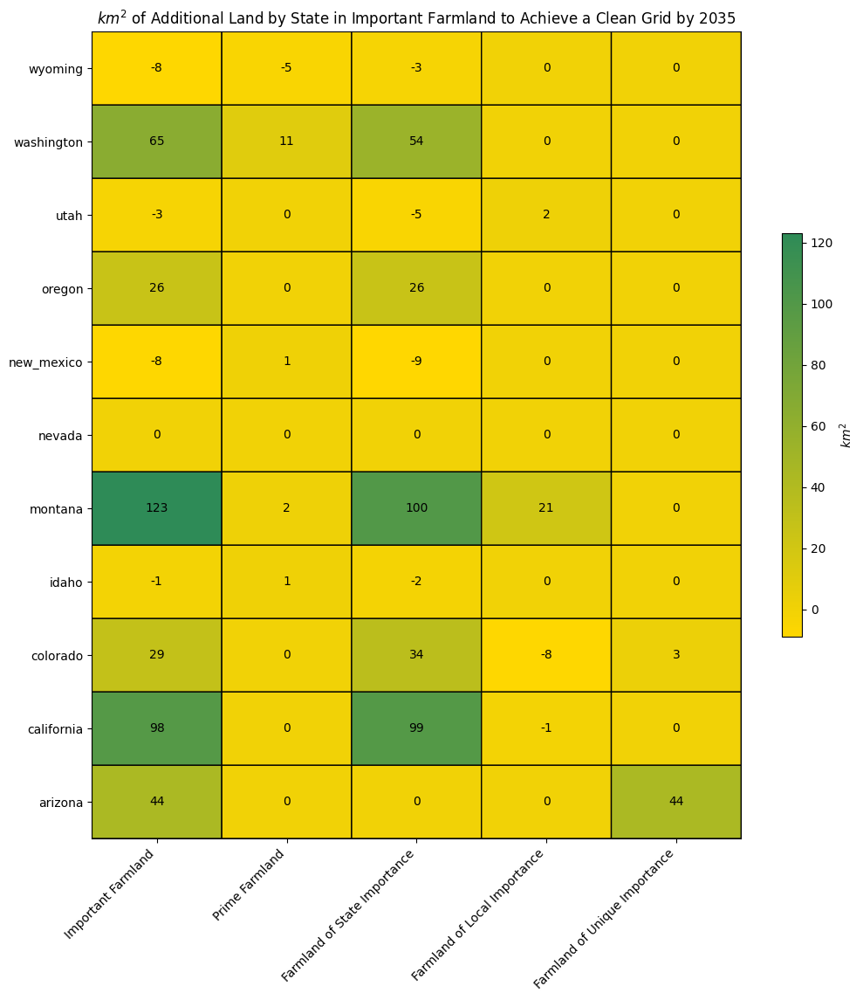

In [129]:
state_intersections = calculate_total_intersections_by_layer(analysis_df=analysis_df, layer_dict=layer_dict, level='state')

plot_heatmap(plot_df=state_intersections, 
             title=f'$km^2$ of Additional Land by State in {analysis_type} to Achieve a Clean Grid by 2035',
             output_file_name='layer_heatmaps/heatmap_diff_state_farmland.png')

##### Calculate Total Intersections by State & Technology


Intersections by state and technology with Important Farmland, Business-as-usual by 2035:



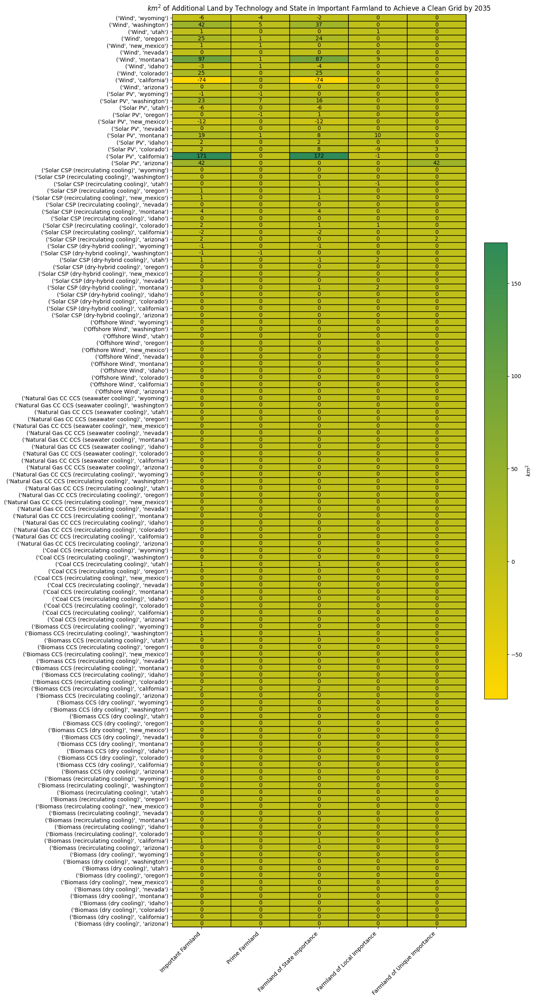

In [130]:
state_tech_intersections = calculate_total_intersections_by_layer(analysis_df=analysis_df, layer_dict=layer_dict, level='state_tech')

plot_heatmap(plot_df=state_tech_intersections, 
             title=f'$km^2$ of Additional Land by Technology and State in {analysis_type} to Achieve a Clean Grid by 2035', figsize=(12, 30),
             output_file_name='layer_heatmaps/heatmap_diff_tech_state_farmland.png')


## Natural Area Proximity

In [ ]:
analysis_df = diff_env_df.copy()

##### Calculate Total Intersections by Layer


Intersections with Natural Area Proximity, Business-as-usual by 2035:



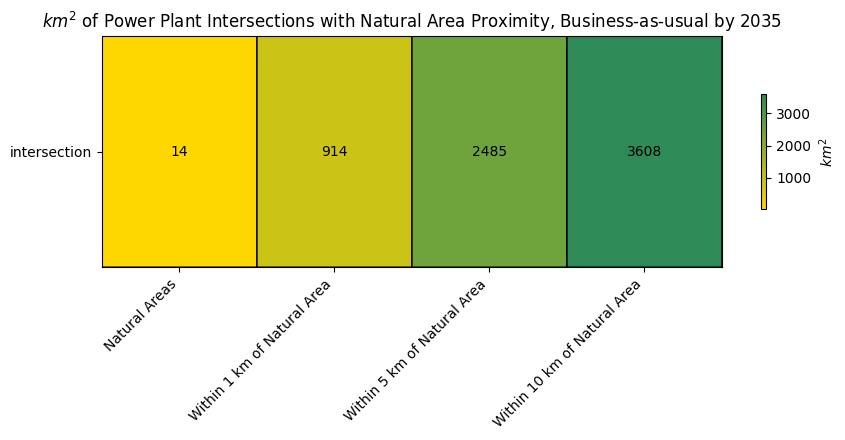

In [115]:
total_intersections = calculate_total_intersections_by_layer(analysis_df=analysis_df, layer_dict=layer_dict, level=None)

plot_heatmap(plot_df=total_intersections, title=f'$km^2$ of Additional Land in {analysis_type} to Achieve a Clean Grid by 2035', 
             figsize=(10, 3), output_file_name='layer_heatmaps/heatmap_diff_total_env_proximity.png')

##### Calculate Total Intersections by Technology


Intersections by technology type with Natural Area Proximity, Business-as-usual by 2035:



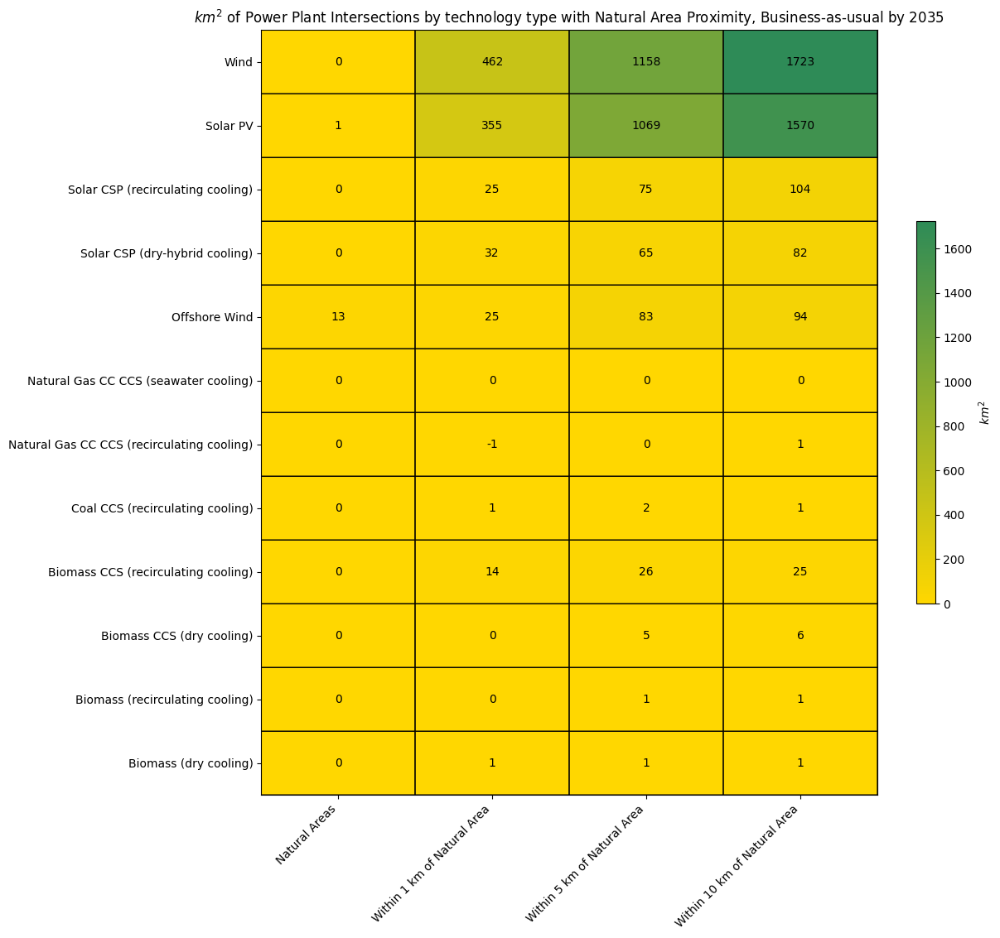

In [116]:
tech_intersections = calculate_total_intersections_by_layer(analysis_df=analysis_df, layer_dict=layer_dict, level='tech')

plot_heatmap(plot_df=tech_intersections, title=f'$km^2$ of Additional Land by Technology in {analysis_type} to Achieve a Clean Grid by 2035',
             output_file_name='layer_heatmaps/heatmap_diff_tech_env_proximity.png')

##### Calculate Total Intersections by State


Intersections by state with Natural Area Proximity, Business-as-usual by 2035:



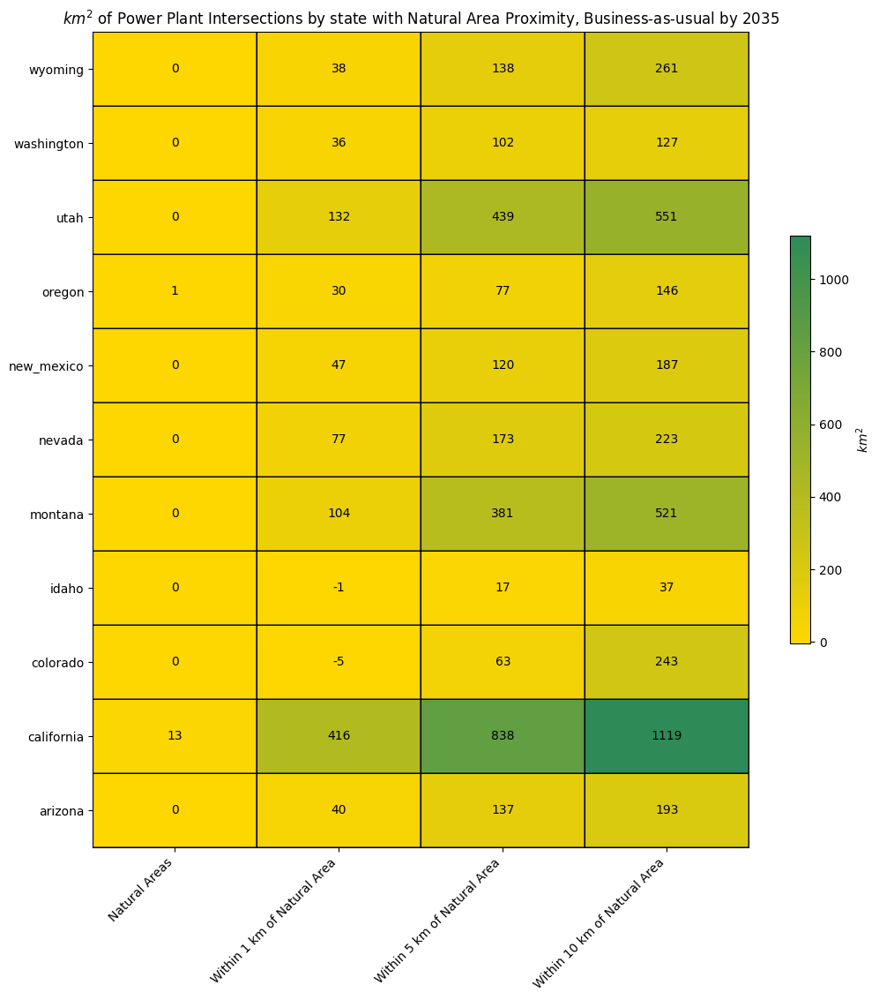

In [117]:
state_intersections = calculate_total_intersections_by_layer(analysis_df=analysis_df, layer_dict=layer_dict, level='state')

plot_heatmap(plot_df=state_intersections, title=f'$km^2$ of Additional Land by State in {analysis_type} to Achieve a Clean Grid by 2035',
             output_file_name='layer_heatmaps/heatmap_diff_state_env_proximity.png')

##### Calculate Total Intersections by State & Technology


Intersections by state and technology with Natural Area Proximity, Business-as-usual by 2035:



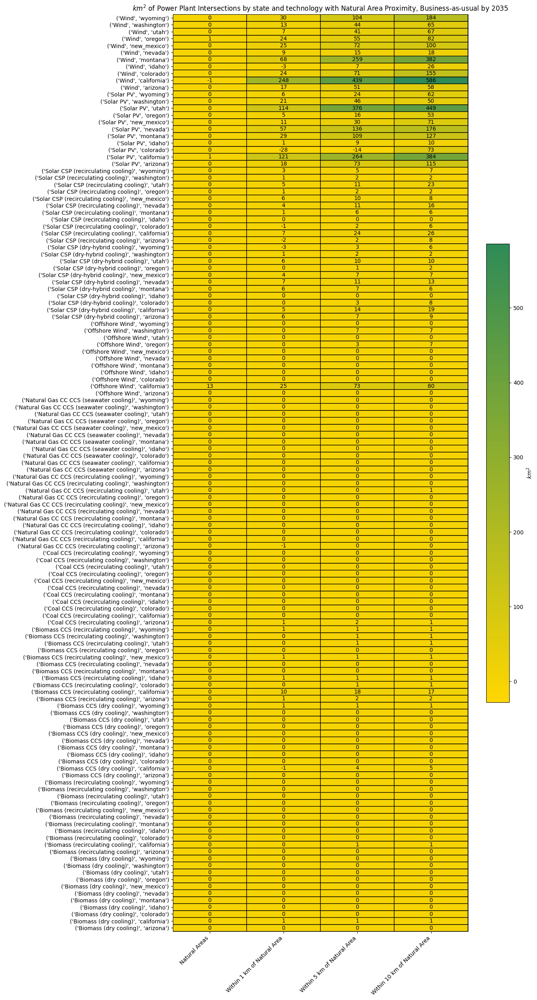

In [118]:
state_tech_intersections = calculate_total_intersections_by_layer(analysis_df=analysis_df, layer_dict=layer_dict, level='state_tech')

plot_heatmap(plot_df=state_tech_intersections, title=f'$km^2$ of Additional Land by Technology & State in {analysis_type} to Achieve a Clean Grid by 2035', figsize=(12, 30),
             output_file_name='layer_heatmaps/heatmap_diff_tech_state_env_proximity.png')